## <center> Wavelength Selection Plots: LASSO & Elastic Net Regression </center>

In [108]:
# Load packages 
import os 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [109]:
# set the working directory 
os.chdir("C:\\Users\\abc\\OneDrive - UGent\\Documenten\\Derick Malavi_PhD Docs_UGent\\Manuscript 4_Coffee\\Wavelength_Selec_LASSO_ENET_Ground_Instant_Coffee")

In [110]:
# Read_data

# LASSO
lasso_ground_msc_sg_2d = pd.read_csv('coffee_ground_msc_sg_2d.csv')
lasso_instant_raw = pd.read_csv('instant_coffee_raw.csv')

# ENET
enet_ground_snv_sg_2d = pd.read_csv('coffee_ground_snv_sg_2d.csv')
enet_instant_raw = pd.read_csv('instant_coffee_raw.csv')


In [111]:
# Check the shape of the data
print(lasso_ground_msc_sg_2d.shape)
print(lasso_instant_raw.shape)
print(enet_ground_snv_sg_2d.shape)
print(enet_instant_raw.shape)

(1469, 229)
(1476, 229)
(1469, 229)
(1476, 229)


In [112]:
# Check the first few rows 
lasso_instant_raw.head(5)

,sample_name,binary_class,three_class,cal_val,perc_adulter,935.609985,939.059998,942.52002,945.97998,949.429993,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,Arabica_10,pure_arabica,pure_arabica,1,0,0.530853,0.533619,0.561054,0.582093,0.596901,...,0.540360,0.536110,0.532238,0.528059,0.525007,0.521218,0.516975,0.511108,0.504414,0.496085
1,Arabica_10,pure_arabica,pure_arabica,1,0,0.533290,0.535996,0.563077,0.583506,0.597973,...,0.539968,0.535841,0.532169,0.528426,0.525502,0.522217,0.517889,0.511993,0.505306,0.497512
2,Arabica_10,pure_arabica,pure_arabica,1,0,0.531486,0.534291,0.561071,0.581973,0.596549,...,0.545723,0.541324,0.537376,0.532705,0.529344,0.525174,0.520571,0.514255,0.507121,0.499195
3,Arabica_11,pure_arabica,pure_arabica,1,0,0.563388,0.566406,0.596824,0.619869,0.635869,...,0.541186,0.537560,0.534226,0.530944,0.528720,0.525882,0.521746,0.516036,0.510318,0.502815
4,Arabica_11,pure_arabica,pure_arabica,1,0,0.560974,0.563901,0.593892,0.617615,0.633946,...,0.540318,0.536781,0.533500,0.530279,0.527773,0.524809,0.520953,0.515072,0.509542,0.502504


In [113]:
enet_ground_snv_sg_2d.head(5)

,sample_id,binary_class,three_class,adult_percent,cal_val,935.609985,939.059998,942.52002,945.97998,949.429993,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,Pure_Arabica_10,pure_arabica,pure_arabica,0,1,-0.010854,-0.010854,-0.010854,-0.010854,-0.010854,...,-0.008527,-0.008020,-0.006674,-0.004880,-0.004880,-0.004880,-0.004880,-0.004880,-0.004880,-0.004880
1,Pure_Arabica_3,pure_arabica,pure_arabica,0,1,-0.008200,-0.008200,-0.008200,-0.008200,-0.008200,...,-0.009745,-0.009059,-0.007410,-0.005147,-0.005147,-0.005147,-0.005147,-0.005147,-0.005147,-0.005147
2,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,-0.010252,-0.010252,-0.010252,-0.010252,-0.010252,...,-0.009393,-0.008636,-0.007115,-0.005134,-0.005134,-0.005134,-0.005134,-0.005134,-0.005134,-0.005134
3,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,-0.008735,-0.008735,-0.008735,-0.008735,-0.008735,...,-0.009490,-0.008614,-0.007036,-0.005032,-0.005032,-0.005032,-0.005032,-0.005032,-0.005032,-0.005032
4,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,-0.009040,-0.009040,-0.009040,-0.009040,-0.009040,...,-0.008376,-0.007820,-0.006739,-0.005271,-0.005271,-0.005271,-0.005271,-0.005271,-0.005271,-0.005271


In [114]:
# Select the X columns

# LASSO
X_lasso_ground_msc_sg_2d = lasso_ground_msc_sg_2d.iloc[:,5:230]
X_lasso_instant_raw = lasso_instant_raw.iloc[:,5:230]

#ENET
X_enet_ground_snv_sg_2d = enet_ground_snv_sg_2d.iloc[:,5:230]
X_enet_instant_raw = enet_instant_raw.iloc[:,5:230]

In [115]:
X_lasso_ground_msc_sg_2d.head(2)

,935.609985,939.059998,942.52002,945.97998,949.429993,952.890015,956.349976,959.809998,963.27002,966.72998,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,-0.000838,-0.000838,-0.000838,-0.000838,-0.000838,-0.000838,-0.000838,-0.000875,-0.000604,-0.000397,...,-0.000658,-0.000619,-0.000515,-0.000377,-0.000377,-0.000377,-0.000377,-0.000377,-0.000377,-0.000377
1,-0.000654,-0.000654,-0.000654,-0.000654,-0.000654,-0.000654,-0.000654,-0.000719,-0.000522,-0.000356,...,-0.000777,-0.000723,-0.000591,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411


### LASSO Selected Wavelengths

#### LASSO Ground Coffee

In [118]:
# Original list of wavelength strings
top_20_variables = [
    'X1442.599976', 'X1670.140015', 'X1126.52002', 'X1439.069946', 'X1343.780029',
    'X1400.199951', 'X1336.73999', 'X1361.390015', 'X1602.349976', 'X1645.150024',
    'X1357.869995', 'X1545.420044', 'X1140.469971', 'X1573.869995', 'X1623.73999',
    'X1312.109985', 'X1298.050049', 'X966.72998', 'X1060.380005', 'X1333.219971'
]

selected_wavelengths_lasso_ground_msc_sg_2d = [float(wavelength.replace("X", "")) for  wavelength in top_20_variables]
print(selected_wavelengths_lasso_ground_msc_sg_2d)

[1442.599976, 1670.140015, 1126.52002, 1439.069946, 1343.780029, 1400.199951, 1336.73999, 1361.390015, 1602.349976, 1645.150024, 1357.869995, 1545.420044, 1140.469971, 1573.869995, 1623.73999, 1312.109985, 1298.050049, 966.72998, 1060.380005, 1333.219971]


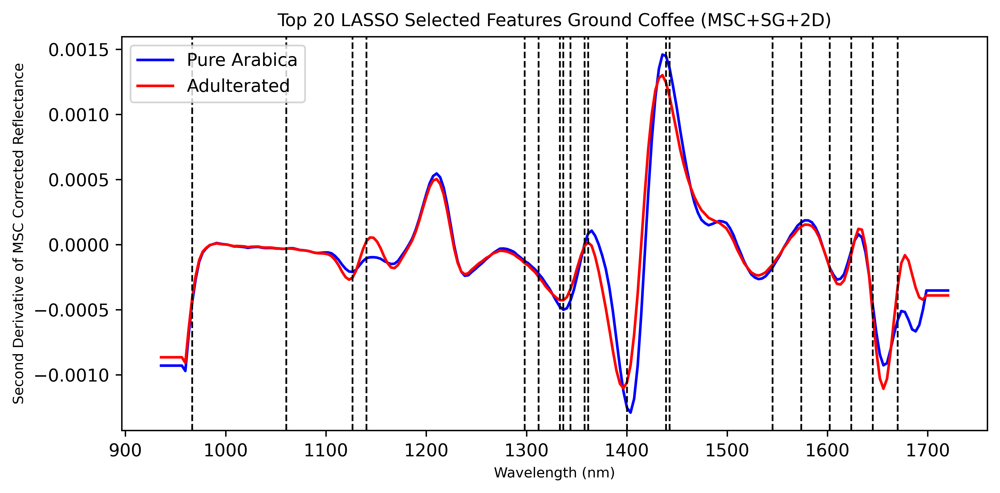

In [119]:
# Identify spectral columns as strings
wavelengths = X_lasso_ground_msc_sg_2d.columns.astype(float)
wavelength_columns = X_lasso_ground_msc_sg_2d.columns  # Keep original names for indexing

# Group by binary class and calculate mean spectra
mean_spectra = lasso_ground_msc_sg_2d.groupby('binary_class')[wavelength_columns].mean()

# Create the plot
plt.figure(figsize=(8, 4), dpi=600)

# Plot mean spectra using float x-axis (converted from string column names)
plt.plot(wavelengths, mean_spectra.loc['pure_arabica'].values, label='Pure Arabica', linewidth=1.5, color='blue')
plt.plot(wavelengths, mean_spectra.loc['adulterated'].values, label='Adulterated', linewidth=1.5, color='red')

# Optional: Highlight selected wavelengths
for wave in selected_wavelengths_lasso_ground_msc_sg_2d:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=1.0)

# Add labels and legend
plt.title('Top 20 LASSO Selected Features Ground Coffee (MSC+SG+2D)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=8)
plt.ylabel('Second Derivative of MSC Corrected Reflectance', fontsize=8)
plt.legend()
plt.tight_layout()
plt.savefig("LASSO_Ground_Coffee_Avg_Spectra.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### LASSO Instant Coffee

In [121]:
top_20_variables = [
    "X1213.869995", "X1231.380005", "X1695.170044", "X1645.150024", "X1478.01001",
    "X1407.26001", "X1691.589966", "X1403.72998", "X1414.319946", "X1474.459961",
    "X1217.369995", "X1470.920044", "X1588.109985", "X1312.109985", "X1112.579956",
    "X1577.430054", "X1595.22998", "X1591.670044", "X1227.869995", "X997.900024"
]

selected_wavelengths_lasso_instant_raw = [float(wavelength.replace("X", "")) for  wavelength in top_20_variables]
print(selected_wavelengths_lasso_instant_raw)

[1213.869995, 1231.380005, 1695.170044, 1645.150024, 1478.01001, 1407.26001, 1691.589966, 1403.72998, 1414.319946, 1474.459961, 1217.369995, 1470.920044, 1588.109985, 1312.109985, 1112.579956, 1577.430054, 1595.22998, 1591.670044, 1227.869995, 997.900024]


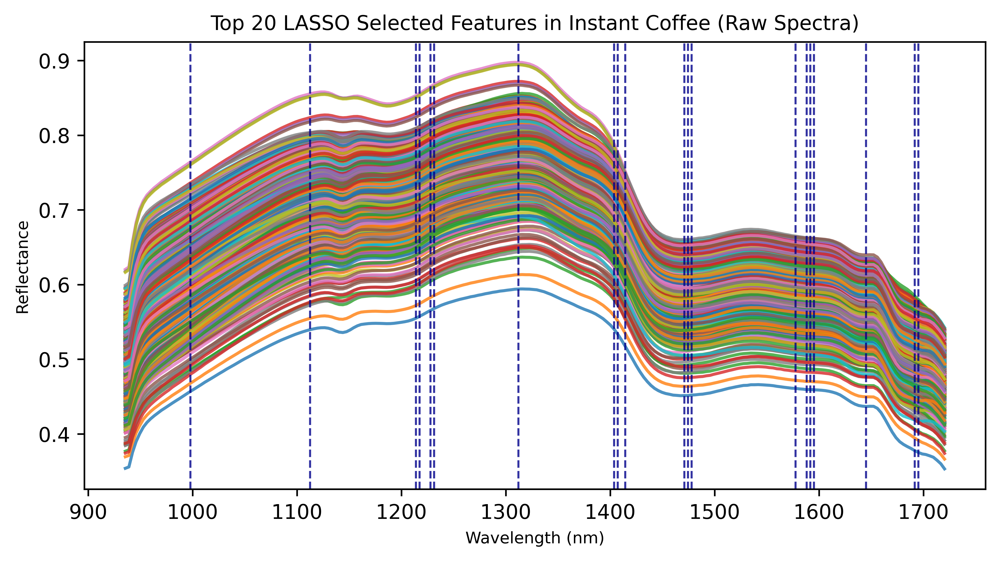

In [122]:
# Get the wavelengths from the column names
wavelengths = X_lasso_instant_raw.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_lasso_instant_raw

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_lasso_instant_raw.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='darkblue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Top 20 LASSO Selected Features in Instant Coffee (Raw Spectra)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=8)
plt.ylabel('Reflectance', fontsize=8)
plt.grid(False)
plt.savefig("LASSO_Raw_Instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

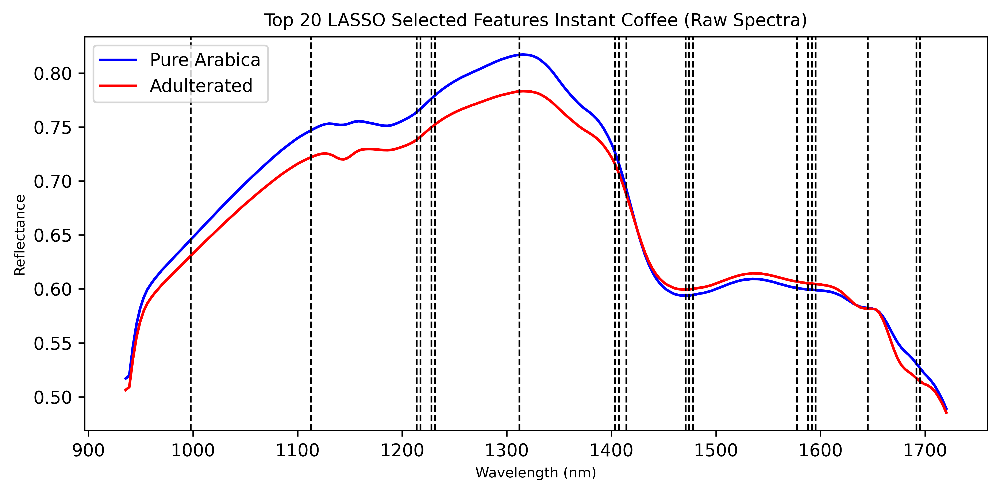

In [123]:
# Identify spectral columns as strings
wavelengths = X_lasso_instant_raw.columns.astype(float)
wavelength_columns = X_lasso_ground_msc_sg_2d.columns  # Keep original names for indexing

# Group by binary class and calculate mean spectra
mean_spectra = lasso_instant_raw.groupby('binary_class')[wavelength_columns].mean()

# Create the plot
plt.figure(figsize=(8, 4), dpi=600)

# Plot mean spectra using float x-axis (converted from string column names)
plt.plot(wavelengths, mean_spectra.loc['pure_arabica'].values, label='Pure Arabica', linewidth=1.5, color='blue')
plt.plot(wavelengths, mean_spectra.loc['adulterated'].values, label='Adulterated', linewidth=1.5, color='red')

# Optional: Highlight selected wavelengths
for wave in selected_wavelengths_lasso_instant_raw:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=1.0)

# Add labels and legend
plt.title('Top 20 LASSO Selected Features Instant Coffee (Raw Spectra)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=8)
plt.ylabel('Reflectance', fontsize=8)
plt.legend()
plt.tight_layout()
plt.savefig("LASSO_Instant_Coffee_Avg_Spectra.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

## Variable Selection by Elastic Net

### ENET Ground Coffee

In [126]:
# Original list of wavelength strings
top_20_variables = [
    "X1439.069946", "X1670.140015", "X1343.780029", "X1333.219971", "X1361.390015",
    "X1442.599976", "X1400.199951", "X1645.150024", "X1126.52002", "X1602.349976",
    "X1573.869995", "X1545.420044", "X1357.869995", "X966.72998", "X1143.959961",
    "X1039.530029", "X1130.01001", "X1112.579956", "X1666.569946", "X1623.73999"
]
selected_wavelengths_enet_ground_snv_sg_2d = [float(wavelength.replace("X", "")) for  wavelength in top_20_variables]
print(selected_wavelengths_enet_ground_snv_sg_2d)

[1439.069946, 1670.140015, 1343.780029, 1333.219971, 1361.390015, 1442.599976, 1400.199951, 1645.150024, 1126.52002, 1602.349976, 1573.869995, 1545.420044, 1357.869995, 966.72998, 1143.959961, 1039.530029, 1130.01001, 1112.579956, 1666.569946, 1623.73999]


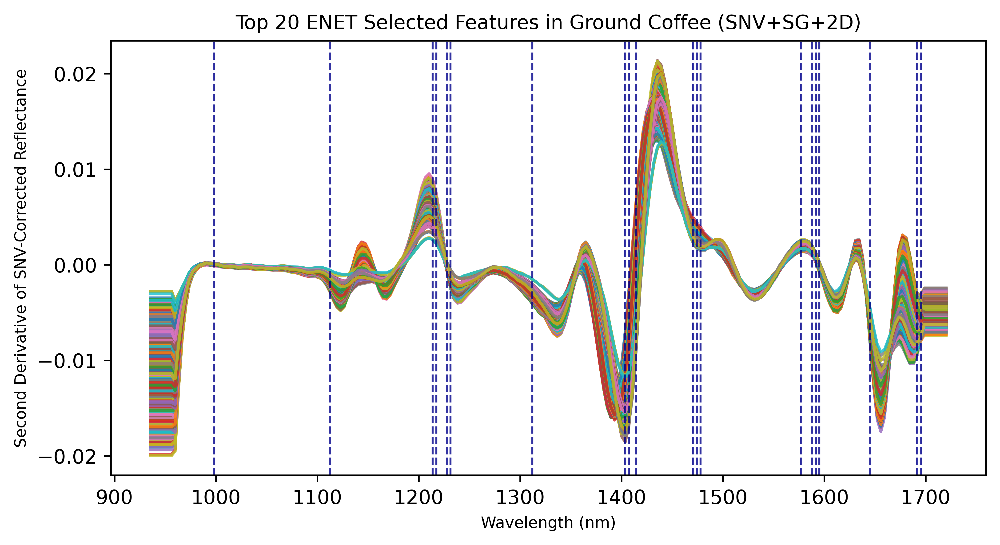

In [127]:
# Get the wavelengths from the column names
wavelengths = X_enet_ground_snv_sg_2d.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_lasso_instant_raw

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_enet_ground_snv_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='darkblue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Top 20 ENET Selected Features in Ground Coffee (SNV+SG+2D)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=8)
plt.ylabel('Second Derivative of SNV-Corrected Reflectance', fontsize=8)
plt.grid(False)
plt.savefig("ENET_SNV_Instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

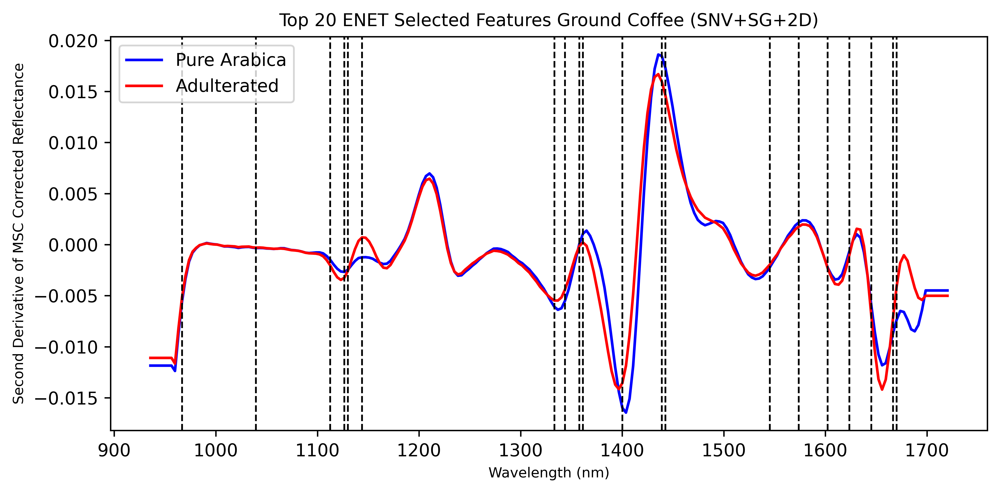

In [128]:
# Identify spectral columns as strings
wavelengths = X_enet_ground_snv_sg_2d.columns.astype(float)
wavelength_columns = X_enet_ground_snv_sg_2d.columns  # Keep original names for indexing

# Group by binary class and calculate mean spectra
mean_spectra = enet_ground_snv_sg_2d.groupby('binary_class')[wavelength_columns].mean()

# Create the plot
plt.figure(figsize=(8, 4), dpi=600)

# Plot mean spectra using float x-axis (converted from string column names)
plt.plot(wavelengths, mean_spectra.loc['pure_arabica'].values, label='Pure Arabica', linewidth=1.5, color='blue')
plt.plot(wavelengths, mean_spectra.loc['adulterated'].values, label='Adulterated', linewidth=1.5, color='red')

# Optional: Highlight selected wavelengths
for wave in selected_wavelengths_enet_ground_snv_sg_2d:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=1.0)

# Add labels and legend
plt.title('Top 20 ENET Selected Features Ground Coffee (SNV+SG+2D)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=8)
plt.ylabel('Second Derivative of MSC Corrected Reflectance', fontsize=8)
plt.legend()
plt.tight_layout()
plt.savefig("ENET_Ground_Coffee_Avg_Spectra.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### ENET Instant Coffee

In [130]:
top_20_variables = [
    "X1231.380005", "X1206.869995", "X1645.150024", "X1234.880005", "X1478.01001",
    "X1695.170044", "X1414.319946", "X1481.550049", "X1252.410034", "X1566.75",
    "X1400.199951", "X1556.089966", "X1386.079956", "X1203.369995", "X1580.98999",
    "X1407.26001", "X1605.920044", "X1698.75", "X1025.650024", "X1573.869995"
]

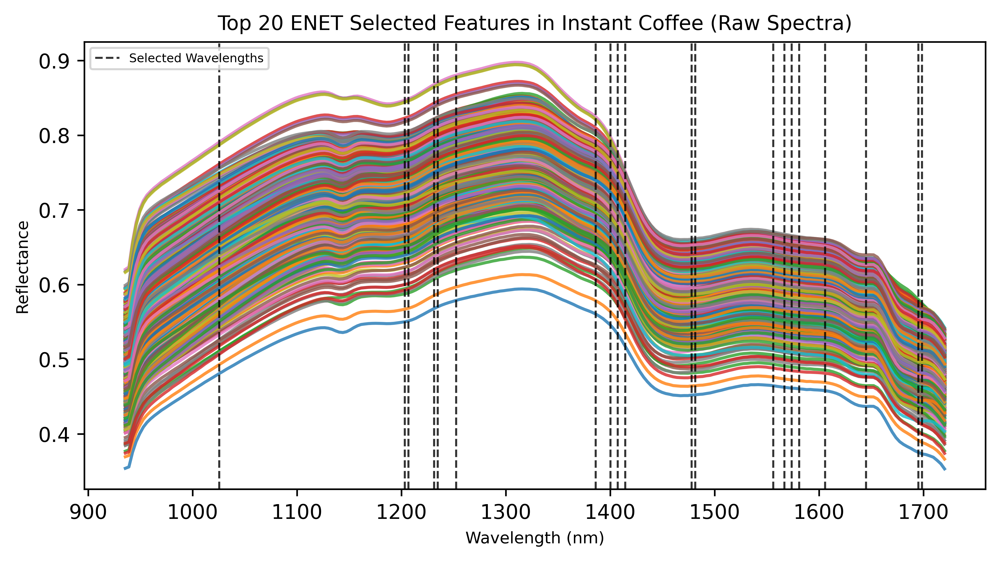

In [131]:
# Convert string column names like "X1231.380005" to float wavelengths
selected_wavelengths_enet_instant_raw = [float(w.replace("X", "")) for w in top_20_variables]

# Get all wavelength values from the DataFrame column names
wavelengths = X_enet_instant_raw.columns.astype(float)

# Plotting the raw spectra
plt.figure(figsize=(8, 4), dpi=600)

# Plot each spectrum
for index, row in X_enet_instant_raw.iterrows():
    plt.plot(wavelengths, row, alpha=0.8)

# Highlight selected wavelengths
for i, wave in enumerate(selected_wavelengths_enet_instant_raw):
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=0.8,
                label="Selected Wavelengths" if i == 0 else "")

# Labels and title
plt.title('Top 20 ENET Selected Features in Instant Coffee (Raw Spectra)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=8)
plt.ylabel('Reflectance', fontsize=8)
plt.legend(fontsize=6)
plt.grid(False)
plt.savefig("ENET_Raw_Instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

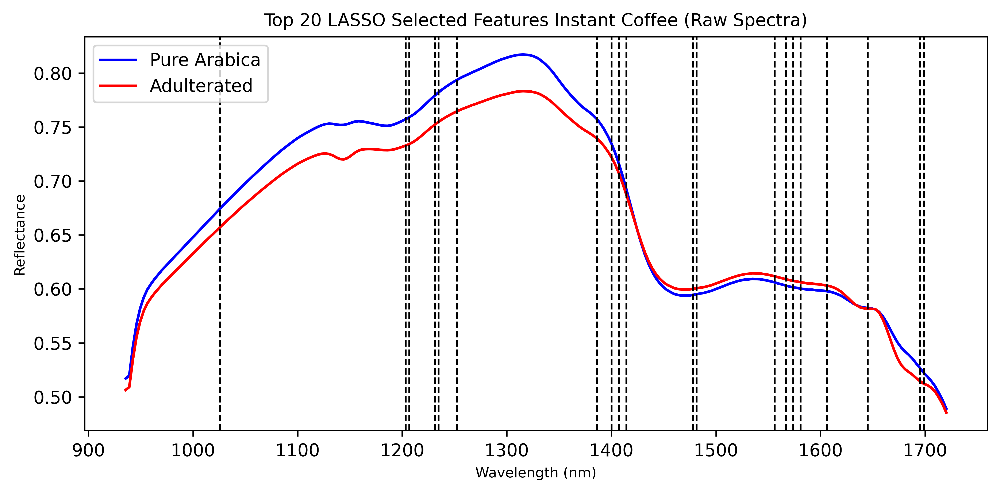

In [132]:
# Identify spectral columns as strings
wavelengths = X_enet_instant_raw.columns.astype(float)
wavelength_columns = X_enet_instant_raw.columns  # Keep original names for indexing

# Group by binary class and calculate mean spectra
mean_spectra = enet_instant_raw.groupby('binary_class')[wavelength_columns].mean()

# Create the plot
plt.figure(figsize=(8, 4), dpi=600)

# Plot mean spectra using float x-axis (converted from string column names)
plt.plot(wavelengths, mean_spectra.loc['pure_arabica'].values, label='Pure Arabica', linewidth=1.5, color='blue')
plt.plot(wavelengths, mean_spectra.loc['adulterated'].values, label='Adulterated', linewidth=1.5, color='red')

# Optional: Highlight selected wavelengths
for wave in selected_wavelengths_enet_instant_raw:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=1.0)

# Add labels and legend
plt.title('Top 20 LASSO Selected Features Instant Coffee (Raw Spectra)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=8)
plt.ylabel('Reflectance', fontsize=8)
plt.legend()
plt.tight_layout()
plt.savefig("ENET_Instant_Coffee_Avg_Spectra.png", dpi=600, bbox_inches="tight", format="png")
plt.show()